# Aims

Aim is to assess for metabolic differences (in 'Compass space') between two populations of fetal ventricular cardiomyocytes.
These populations are pretty close in gene expresson space (they are two cell states of the same cell type - ventricular cardiomyocytes).
Before running Compass, a 'compass label' (a concatenation of donor/cellvnuclei/10xkit) was made, and each of these was partitioned into many pseudobulk samples (partitioned barcodes within a label randomly, into groups of 10 cells).

# Import and settings

In [1]:
%load_ext autoreload
%autoreload 2

from time import localtime, strftime
import os, re, gc, joblib
import numpy as np
import numpy_groupies as npg
import pandas as pd

import anndata
import scanpy as sc
import sctk as sk

import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib.colors import ListedColormap
import seaborn as sn
import plotnine as pln
from datetime import date

# YYYY-MM-DD
today = date.today()
today = today.strftime("%Y-%m-%d")

np.set_printoptions(linewidth=150)

rcParams["pdf.fonttype"] = 42
rcParams["ps.fonttype"] = 42

sc.settings.verbosity = 0
expr_cmap = sk.expression_colormap()
sk.set_figsize((4, 4))

def timestamp(date_only=True):
    stamp_format = "%Y%m%d" if date_only else "%Y%m%d-%H%M"
    return strftime(stamp_format, localtime())

In [2]:
np.set_printoptions(linewidth=150)

rcParams["pdf.fonttype"] = 42
rcParams["ps.fonttype"] = 42

sc.settings.verbosity = 0
expr_cmap = sk.expression_colormap()
sk.set_figsize((4, 4))

In [3]:
def timestamp(date_only=True):
    stamp_format = "%Y%m%d" if date_only else "%Y%m%d-%H%M"
    return strftime(stamp_format, localtime())

In [4]:
def get_reaction_consistencies(compass_reaction_penalties, min_range=1e-3):
    """
    Converts the raw penalties outputs of compass into scores per reactions where higher numbers indicate more activity
    """
    df = -np.log(compass_reaction_penalties + 1)
    df = df[df.max(axis=1) - df.min(axis=1) >= min_range]
    df = df - df.min().min()
    return df

# Load data

In [5]:
path='/nfs/team205/heart/compass/'
run='fetal_all_cells_batched_rand40'

cell_md= pd.read_csv(f'{path}{run}/cell_metadata.csv', index_col = 0)
cell_md.head(3)

/tmp/ipykernel_1743/3307965764.py:4: DtypeWarning: Columns (35,40) have mixed types. Specify dtype option on import or set low_memory=False.


,latent_RT_efficiency,latent_cell_probability,latent_scale,sangerID,combinedID,donor,donor_type,region_finest,facility,cell_or_nuclei,...,age,cycling,S_score,G2M_score,phase,stress_score,hb1_score,age_binned,compass_label,partition_40
barcode,,,,,,,,,,,,,,,,,,,,,
BHF_F_Hea10402917_TGGCTGGGTTGTGGAG-1,5.218614,0.999939,123665.210938,BHF_F_Hea10402917,na,C86,na,Heart,Sanger,Cell,...,12W5D,Yes,-0.005998,-0.126205,G1,0.494416,-0.223034,lateT1,CoronaryEndothelialCellsCapillary_Cell_C86_lateT1,CoronaryEndothelialCellsCapillary_Cell_C86_lat...
BHF_F_Hea10402917_ATGTGTGTCGAACGGA-1,3.109560,0.999991,10201.502930,BHF_F_Hea10402917,na,C86,na,Heart,Sanger,Cell,...,12W5D,Yes,0.656214,0.093990,S,1.074951,-0.143935,lateT1,InnateLymphoidCells_Cell_C86_lateT1,"InnateLymphoidCells_Cell_C86_lateT1,3"
BHF_F_Hea10402917_CAGGTGCAGGCTATCT-1,3.181446,0.999989,10217.305664,BHF_F_Hea10402917,na,C86,na,Heart,Sanger,Cell,...,12W5D,Yes,0.386814,1.163369,G2M,0.460513,-0.138523,lateT1,BCells_Cell_C86_lateT1,"BCells_Cell_C86_lateT1,0"


In [6]:
# add the midgrain annotations

midgrain=pd.read_csv('/nfs/team205/heart/anndata_objects/Foetal/final_annotation/mid_grain_annotation_barcodes.csv')
midgrain=midgrain.set_index('barcode')
midgrain.head(3)

cell_md = cell_md.merge(midgrain, left_index=True, right_index=True)

In [7]:
partition_label='partition_40'

In [8]:
# Make some metadata (modal valuess for categoricals, means for continuous)
# if it already exists, just read in


if os.path.exists(f'{path}{run}/cluster_md.csv')==False:
    clusters=cell_md[partition_label].unique() # add the partition label

    label=[]
    clus_donor=[]
    clus_fine_grain=[]
    clus_mid_grain=[]
    clus_coarse_grain=[]
    clus_cell_or_nuclei=[]
    clus_age=[]
    clus_age_binned=[]
    clus_kit_10x=[]
    clus_facility=[]
    clus_n_genes=[]
    clus_n_counts=[]
    clus_S_score=[]
    clus_G2M_score=[]
    clus_total_counts=[]
    clus_total_counts_mt=[]
    clus_total_counts_ribo=[]

    for cluster in range(len(clusters)):
        label.append(clusters[cluster])
        clus_donor.append(cell_md['donor'][cell_md[partition_label]==clusters[cluster]].mode()[0])
        clus_fine_grain.append(cell_md['fine_grain'][cell_md[partition_label]==clusters[cluster]].mode()[0])
        clus_mid_grain.append(cell_md['mid_grain'][cell_md[partition_label]==clusters[cluster]].mode()[0])
        clus_coarse_grain.append(cell_md['coarse_grain'][cell_md[partition_label]==clusters[cluster]].mode()[0])
        clus_cell_or_nuclei.append(cell_md['cell_or_nuclei'][cell_md[partition_label]==clusters[cluster]].mode()[0])
        clus_age.append(cell_md['age'][cell_md[partition_label]==clusters[cluster]].mode()[0])
        clus_age_binned.append(cell_md['age_binned'][cell_md[partition_label]==clusters[cluster]].mode()[0])
        clus_kit_10x.append(cell_md['kit_10x'][cell_md[partition_label]==clusters[cluster]].mode()[0])
        clus_facility.append(cell_md['facility'][cell_md[partition_label]==clusters[cluster]].mode()[0])
        clus_n_genes.append(cell_md['n_genes'][cell_md[partition_label]==clusters[cluster]].mean())
        clus_n_counts.append(cell_md['n_counts'][cell_md[partition_label]==clusters[cluster]].mean())
        clus_S_score.append(cell_md['S_score'][cell_md[partition_label]==clusters[cluster]].mean())
        clus_G2M_score.append(cell_md['G2M_score'][cell_md[partition_label]==clusters[cluster]].mean())
        clus_total_counts.append(cell_md['total_counts'][cell_md[partition_label]==clusters[cluster]].mean())
        clus_total_counts_mt.append(cell_md['total_counts_mt'][cell_md[partition_label]==clusters[cluster]].mean())
        clus_total_counts_ribo.append(cell_md['total_counts_ribo'][cell_md[partition_label]==clusters[cluster]].mean())

    df_dict={
        'label':label,
        'clus_fine_grain':clus_fine_grain,
        'clus_mid_grain':clus_mid_grain,
        'clus_coarse_grain':clus_coarse_grain,
        'clus_donor':clus_donor,
        'clus_cell_or_nuclei':clus_cell_or_nuclei,
        'clus_age':clus_age,
        'clus_age_binned':clus_age_binned,
        'clus_kit_10x':clus_kit_10x,
        'clus_facility':clus_facility,
        'clus_n_genes':clus_n_genes,
        'clus_S_score':clus_S_score,
        'clus_G2M_score':clus_G2M_score,
        'clus_n_counts':clus_n_counts,
        'clus_total_counts':clus_total_counts,
        'clus_total_counts_mt':clus_total_counts_mt,
        'clus_total_counts_ribo':clus_total_counts_ribo
    }

    cluster_md=pd.DataFrame.from_dict(df_dict)
    cluster_md.to_csv(f'{path}{run}/cluster_md.csv',index=False)
if os.path.exists(f'{path}{run}/cluster_md.csv')==True:
    cluster_md=pd.read_csv(f'{path}{run}/cluster_md.csv')

cluster_md

,label,clus_fine_grain,clus_mid_grain,clus_coarse_grain,clus_donor,clus_cell_or_nuclei,clus_age,clus_age_binned,clus_kit_10x,clus_facility,clus_n_genes,clus_S_score,clus_G2M_score,clus_n_counts,clus_total_counts,clus_total_counts_mt,clus_total_counts_ribo
0,CoronaryEndothelialCellsCapillary_Cell_C86_lat...,CoronaryEndothelialCellsCapillary,BloodVesselEndothelialCells,Endothelium,C86,Cell,12W5D,lateT1,5prime-v2,Sanger,3250.111111,-0.063685,-0.070932,11045.733333,11045.733333,297.466667,675.222222
1,"InnateLymphoidCells_Cell_C86_lateT1,3",InnateLymphoidCells,LymphoidCells,Immune,C86,Cell,12W5D,lateT1,5prime-v2,Sanger,3084.743590,-0.064000,-0.072241,9772.794872,9772.794872,255.589744,854.769231
2,"BCells_Cell_C86_lateT1,0",BCells,LymphoidCells,Immune,C86,Cell,12W5D,lateT1,5prime-v2,Sanger,2876.000000,0.341761,0.092975,8866.119048,8866.119048,157.809524,698.833333
3,"InnateLymphoidCells_Cell_C86_lateT1,2",InnateLymphoidCells,LymphoidCells,Immune,C86,Cell,12W5D,lateT1,5prime-v2,Sanger,3133.692308,-0.092905,-0.079844,9756.410256,9756.410256,256.846154,858.512821
4,"ProBCells_Cell_C86_lateT1,1",ProBCells,LymphoidCells,Immune,C86,Cell,12W5D,lateT1,5prime-v2,Sanger,4056.102564,0.773935,0.566245,14304.410256,14304.410256,257.769231,1129.076923
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4609,"MacrophagesCX3CR1pos_Nuclei_C98_lateT1,0",MacrophagesCX3CR1pos,MyeloidCells,Immune,C98,Nuclei,9W1D,lateT1,Multiome-v1,Sanger,2164.025000,-0.200320,-0.182695,4347.725000,4347.725000,23.525000,59.475000
4610,"NeuronProgenitors_Nuclei_C98_lateT1,0",NeuronProgenitors,Neurons,Neural,C98,Nuclei,9W1D,lateT1,Multiome-v1,Sanger,2283.833333,-0.167053,-0.131623,4822.166667,4822.166667,8.500000,79.500000
4611,"CoronarySmoothMuscleCells_Nuclei_C98_lateT1,0",CoronarySmoothMuscleCells,MuralCells,Mesenchymal,C98,Nuclei,9W1D,lateT1,Multiome-v1,Sanger,3007.000000,-0.060513,-0.207424,6632.000000,6632.000000,14.000000,25.000000
4612,"CoronaryPericytes_Nuclei_C98_lateT1,0",CoronaryPericytes,MuralCells,Mesenchymal,C98,Nuclei,9W1D,lateT1,Multiome-v1,Sanger,1760.166667,-0.132453,-0.202980,3715.666667,3715.666667,7.833333,40.166667


In [9]:
# this is a reference file - not specific to each run of Compass
reaction_metadata = pd.read_csv("/home/jovyan/COMPASSResources/reaction_metadata.csv", index_col = 0)
reaction_metadata

,reaction_name,formula,associated_genes,subsystem,EC_number,confidence
reaction_no_direction,,,,,,
10FTHF5GLUtl,"5-glutamyl-10FTHF transport, lysosomal",1.00 * 10-formyltetrahydrofolate-[Glu](5) [c] ...,NaN,"Transport, lysosomal",NaN,2.0
10FTHF5GLUtm,"5-glutamyl-10FTHF transport, mitochondrial",1.00 * 10-formyltetrahydrofolate-[Glu](5) [m] ...,NaN,"Transport, mitochondrial",NaN,2.0
10FTHF6GLUtl,"6-glutamyl-10FTHF transport, lysosomal",1.00 * 10-formyltetrahydrofolate-[Glu](6) [c] ...,NaN,"Transport, lysosomal",NaN,2.0
10FTHF6GLUtm,"6-glutamyl-10FTHF transport, mitochondrial",1.00 * 10-formyltetrahydrofolate-[Glu](6) [m] ...,NaN,"Transport, mitochondrial",NaN,2.0
10FTHF7GLUtl,"7-glutamyl-10FTHF transport, lysosomal",1.00 * 10-formyltetrahydrofolate-[Glu](7) [c] ...,NaN,"Transport, lysosomal",NaN,2.0
...,...,...,...,...,...,...
MAL_Lte,Transport of L-malate,1.00 * (S)-malate(2-) [e] --> 1.00 * (S)-malat...,NaN,"Transport, extracellular",NaN,NaN
OROTGLUt,OROTGLUt,1.00 * L-glutamate(1-) [c] + 1.00 * Orotate [e...,SLC22A7,"Transport, extracellular",NaN,NaN
PNTOte,Transport of (R)-Pantothenate,1.00 * (R)-Pantothenate [e] --> 1.00 * (R)-Pan...,NaN,"Transport, extracellular",NaN,NaN


In [10]:
#Inspect the reactions
rxns=get_reaction_consistencies(pd.read_csv(f'{path}{run}/out/reactions.tsv', sep="\t", index_col=0)).T
rxns.head(3)

,10FTHF5GLUtl_pos,10FTHF5GLUtm_pos,10FTHF6GLUtl_pos,10FTHF6GLUtm_pos,10FTHF7GLUtl_pos,10FTHF7GLUtm_pos,10FTHFtl_neg,10FTHFtm_neg,10FTHFtm_pos,11DOCRTSLtm_pos,...,sink_5hpet(c)_pos,sink_c101coa(c)_neg,sink_c81coa(c)_neg,sink_citr(c)_pos,sink_dd2coa(c)_neg,sink_decdicoa(c)_neg,sink_octdececoa(c)_neg,sink_pre_prot(r)_neg,sink_tetdec2coa(c)_neg,sink_tetdece1coa(c)_neg
"AtrialCardiomyocytesCycling_Cell_BRC2251_lateT1,0",3.626295,3.271784,3.403265,3.193497,3.278546,3.144474,3.626295,2.758188,1.860984,0.670307,...,7.014768,2.062240,2.062240,1.798224,2.062240,2.062240,1.720069,7.540845,2.062240,2.062240
"AtrialCardiomyocytesCycling_Cell_BRC2252_earlyT1,0",3.648002,3.319991,3.431319,3.255088,3.332344,3.214012,3.648002,2.825189,1.890098,0.680958,...,7.036594,2.078961,2.078961,1.813441,2.078961,2.078961,1.741592,7.556061,2.078961,2.078961
"AtrialCardiomyocytesCycling_Cell_BRC2252_earlyT1,1",3.639285,3.311532,3.420415,3.241517,3.314297,3.197387,3.639285,2.788475,1.886033,0.671948,...,7.018887,2.066064,2.066064,1.803234,2.066064,2.066064,1.723343,7.547272,2.066064,2.066064


In [11]:
#if you want to filter just pos reactions
#pos_list = [col for col in rxns.columns if col.endswith('_pos')]
#rxns=rxns[pos_list]

In [12]:
# read in to anndata
pooled_ad = anndata.AnnData(rxns)

/tmp/ipykernel_1743/1026853969.py:2: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.


In [13]:
# add the cell state label to .obs
pooled_ad.obs['compass_sample_id']=pooled_ad.obs.index
pooled_ad.obs[['fine_grain','cluster']]=pooled_ad.obs['compass_sample_id'].str.split(',', expand=True)

In [14]:
# Add the metadata
cluster_md=cluster_md.set_index('label')
pooled_ad.obs=pooled_ad.obs.merge(cluster_md,left_index=True,right_index=True)

In [15]:
# get reaction ID column
pooled_ad.var['metadata_r_id'] = ""
for r in pooled_ad.var.index:
    if r in reaction_metadata.index:
        pooled_ad.var.loc[r, 'metadata_r_id'] = r
    elif r[:-4] in reaction_metadata.index:
        pooled_ad.var.loc[r, 'metadata_r_id'] = r[:-4]
    else:
        print("Should not occur")

In [16]:
pooled_ad.var=pooled_ad.var.merge(reaction_metadata, how='left',
                         left_on='metadata_r_id', right_index=True, validate='m:1')

<AxesSubplot:>

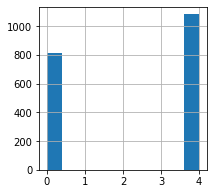

In [62]:
pooled_ad.var['confidence'].hist()

In [18]:
pooled_ad.var

,metadata_r_id,reaction_name,formula,associated_genes,subsystem,EC_number,confidence
10FTHF5GLUtl_pos,10FTHF5GLUtl,"5-glutamyl-10FTHF transport, lysosomal",1.00 * 10-formyltetrahydrofolate-[Glu](5) [c] ...,NaN,"Transport, lysosomal",NaN,2.0
10FTHF5GLUtm_pos,10FTHF5GLUtm,"5-glutamyl-10FTHF transport, mitochondrial",1.00 * 10-formyltetrahydrofolate-[Glu](5) [m] ...,NaN,"Transport, mitochondrial",NaN,2.0
10FTHF6GLUtl_pos,10FTHF6GLUtl,"6-glutamyl-10FTHF transport, lysosomal",1.00 * 10-formyltetrahydrofolate-[Glu](6) [c] ...,NaN,"Transport, lysosomal",NaN,2.0
10FTHF6GLUtm_pos,10FTHF6GLUtm,"6-glutamyl-10FTHF transport, mitochondrial",1.00 * 10-formyltetrahydrofolate-[Glu](6) [m] ...,NaN,"Transport, mitochondrial",NaN,2.0
10FTHF7GLUtl_pos,10FTHF7GLUtl,"7-glutamyl-10FTHF transport, lysosomal",1.00 * 10-formyltetrahydrofolate-[Glu](7) [c] ...,NaN,"Transport, lysosomal",NaN,2.0
...,...,...,...,...,...,...,...
sink_decdicoa(c)_neg,sink_decdicoa(c),"Sink for 2,6-dodecadienoylcoa(c)",1.00 * decadienoylcoa [c] --> ϕ\nNo genes,NaN,Fatty acid oxidation,NaN,NaN
sink_octdececoa(c)_neg,sink_octdececoa(c),OCTDECECOASINK,1.00 * octadecenoylcoa [c] --> ϕ\nNo genes,NaN,Fatty acid oxidation,NaN,NaN
sink_pre_prot(r)_neg,sink_pre_prot(r),glycophosphatidylinositol (GPI)-anchored prote...,1.00 * glycophosphatidylinositol (GPI)-anchore...,NaN,Exchange/demand reaction,2.4.99.9,1.0
sink_tetdec2coa(c)_neg,sink_tetdec2coa(c),TETDEC2COASINK,1.00 * tetradecadienoylcoa [c] --> ϕ\nNo genes,NaN,Fatty acid oxidation,NaN,NaN


In [19]:
# remove reactions with confidences that are not 0 or 4 (guidance in compass tutorial)
print(pooled_ad.shape)
pooled_ad=pooled_ad[:,pooled_ad.var['confidence'].isin([0,4])]
print(pooled_ad.shape)
pooled_ad=pooled_ad[:,pooled_ad.var['EC_number'].notna()]
print(pooled_ad.shape)

(4614, 6509)
(4614, 4373)
(4614, 1895)


In [20]:
# remove reactions with confidences that are not 0 or 4 (guidance in compass tutorial)
pooled_ad.var['formula'][(pooled_ad.var['formula'].str.contains("[m]"))&(pooled_ad.var['subsystem'] == "Citric acid cycle")]


ACITL_pos       1.00 * ATP [c] + 1.00 * Coenzyme A [c] + 1.00 ...
ACONTm_neg      1.00 * Citrate [m] --> 1.00 * Isocitrate [m]\n...
ACONTm_pos      1.00 * Citrate [m] --> 1.00 * Isocitrate [m]\n...
AKGDm_pos       1.00 * 2-Oxoglutarate [m] + 1.00 * Coenzyme A ...
CSm_pos         1.00 * Water [m] + 1.00 * Acetyl-CoA [m] + 1.0...
FUM_neg         1.00 * Water [c] + 1.00 * Fumarate [c] --> 1.0...
FUM_pos         1.00 * Water [c] + 1.00 * Fumarate [c] --> 1.0...
FUMm_neg        1.00 * Water [m] + 1.00 * Fumarate [m] --> 1.0...
FUMm_pos        1.00 * Water [m] + 1.00 * Fumarate [m] --> 1.0...
ICDHxm_pos      1.00 * Nicotinamide adenine dinucleotide [m] +...
ICDHy_pos       1.00 * Nicotinamide adenine dinucleotide phosp...
ICDHyp_pos      1.00 * Nicotinamide adenine dinucleotide phosp...
ICDHyrm_neg     1.00 * Nicotinamide adenine dinucleotide phosp...
ICDHyrm_pos     1.00 * Nicotinamide adenine dinucleotide phosp...
MDH_neg         1.00 * Nicotinamide adenine dinucleotide [c] +...
MDH_pos   

In [21]:
pooled_ad.write(f'{path}{run}/compass.anndata_converted.{today}.h5ad')

/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
/home/jovyan/my-conda-envs/sca

# QC/Inspect

In [22]:
pooled_ad0 = pooled_ad.copy()

<AxesSubplot:>

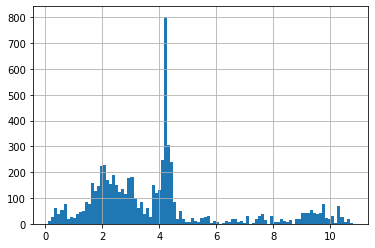

In [23]:
rxns.mean().hist(bins=100)

Distribution very multi-modal

<AxesSubplot:>

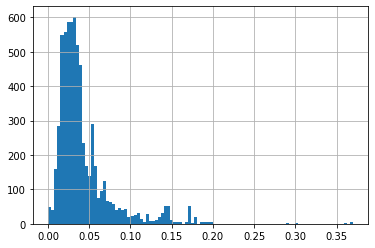

In [24]:
rxns.std().hist(bins=100)

There is very little variability in reactions across cell states

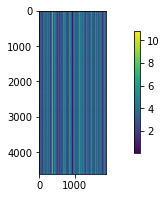

In [25]:
sk.set_figsize((10, 3))
plt.imshow(pooled_ad0.X)
plt.colorbar(shrink=0.75);

# Whole Object

In [26]:
adata = pooled_ad0.copy()

In [27]:
print(pooled_ad0.X.mean())
print(pooled_ad0.X.std())

3.5256069
2.259224


In [28]:
#log normalising
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.raw = adata

In [29]:
print(adata.X.mean())
print(adata.X.std())

1.7112213
0.49672458


In [30]:
adata.raw.shape

(4614, 1895)

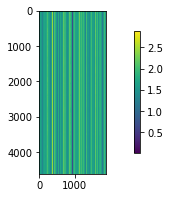

In [31]:
sk.set_figsize((10, 3))
plt.imshow(adata.X)
plt.colorbar(shrink=0.75);

In [32]:
adata.raw.X.sum(axis=1).min(), adata.raw.X.sum(axis=1).max()

(3220.6523, 3254.1626)

In [33]:
sc.pp.scale(adata, zero_center=True, max_value=10)

In [34]:
sc.pp.pca(adata, use_highly_variable=False)
sc.pp.neighbors(adata)
sc.tl.umap(adata)

/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html


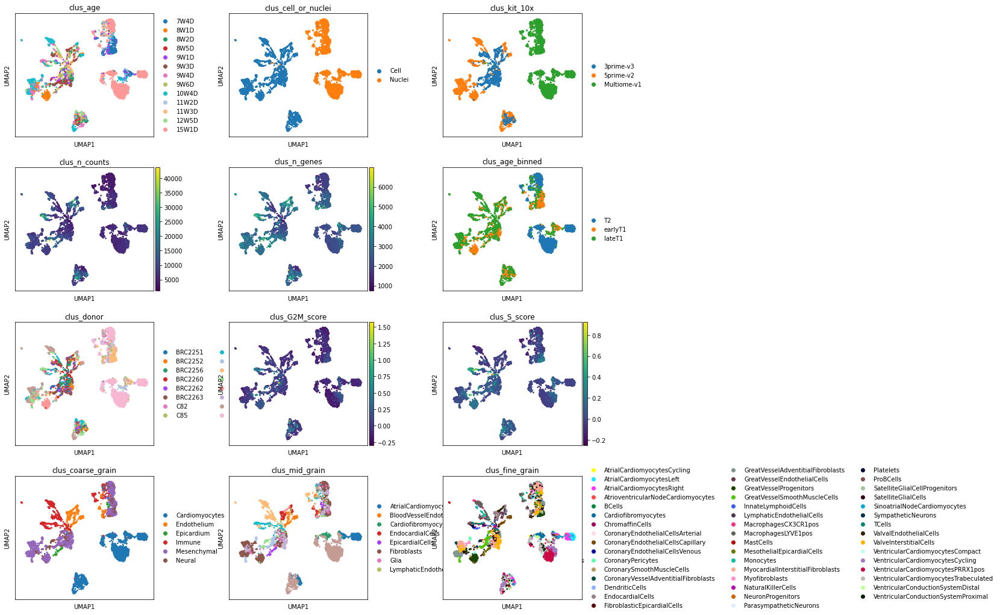

In [35]:
sk.set_figsize((4, 4))
sc.pl.umap(adata, wspace=0.4, size=30,ncols=3,
          color=['clus_age','clus_cell_or_nuclei','clus_kit_10x','clus_n_counts','clus_n_genes','clus_age_binned','clus_donor','clus_G2M_score','clus_S_score','clus_coarse_grain','clus_mid_grain','clus_fine_grain'])

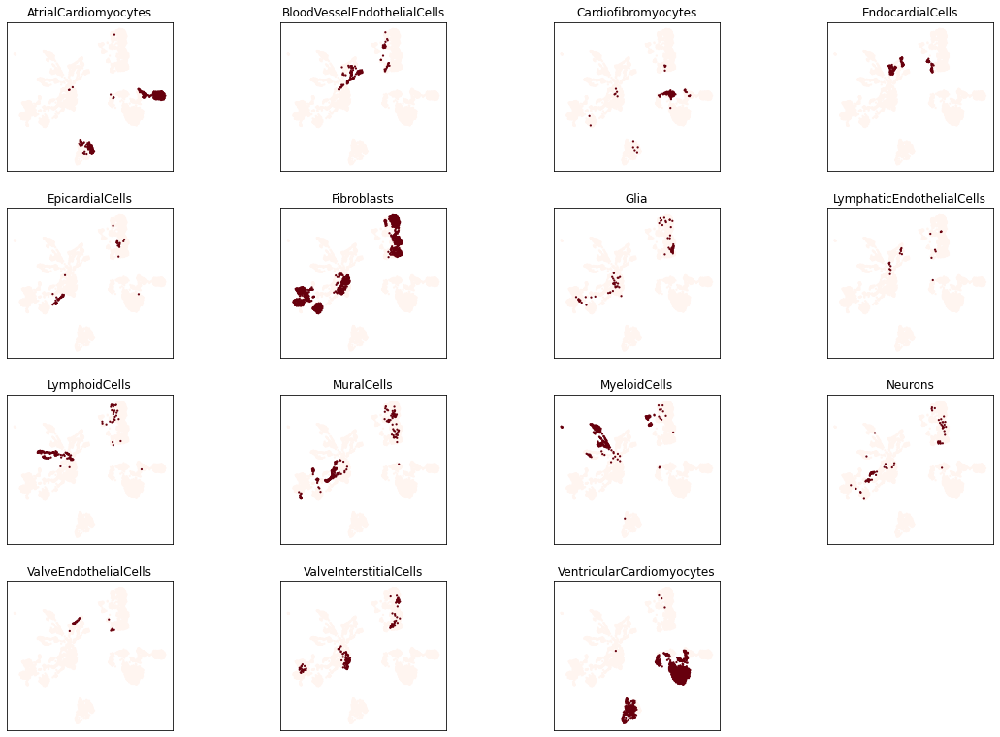

In [36]:
sk.highlight(
    adata, basis="umap", groupby="clus_mid_grain", wspace=0.5, figsize=(3, 3), size=20
)

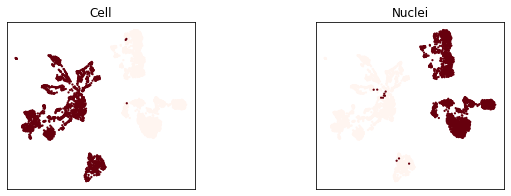

In [37]:
sk.highlight(
    adata, basis="umap", groupby="clus_cell_or_nuclei", wspace=0.5, figsize=(3, 3), size=20
)

In [38]:
sc.tl.leiden(adata, resolution=0.3, key_added="leiden")

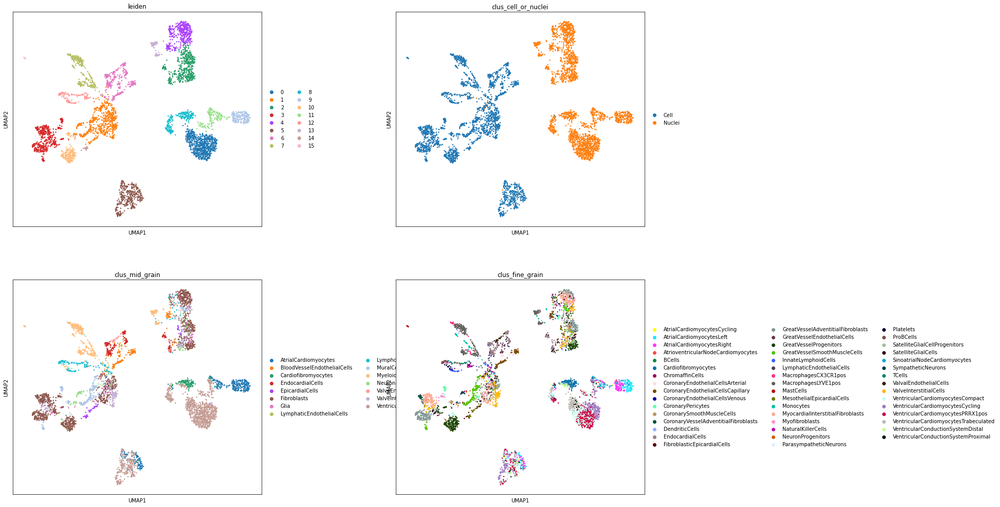

In [39]:
sk.set_figsize([8,8])
sc.pl.umap(adata, color=["leiden",'clus_cell_or_nuclei','clus_mid_grain','clus_fine_grain'],wspace=0.4,ncols=2)

[]

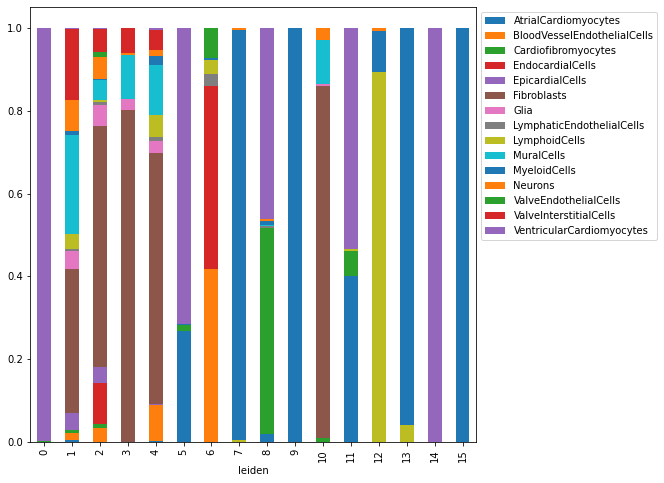

In [40]:
# Find out which cells contribute to each cluster

tmp = pd.crosstab(adata.obs['leiden'], adata.obs['clus_mid_grain'], normalize='index')
# tmp.plot.bar().legend(loc=1)
ax = tmp.plot.bar(stacked=True)
ax.grid(False)
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

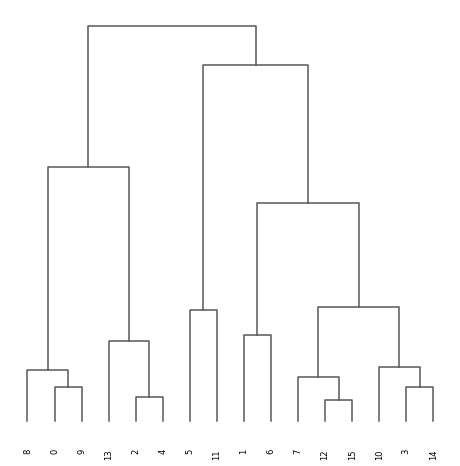

<AxesSubplot:>

In [41]:
sc.tl.dendrogram(adata, groupby = "leiden")
sc.pl.dendrogram(adata, groupby = "leiden")

In [42]:
sc.tl.rank_genes_groups(adata,
                       groupby='leiden')

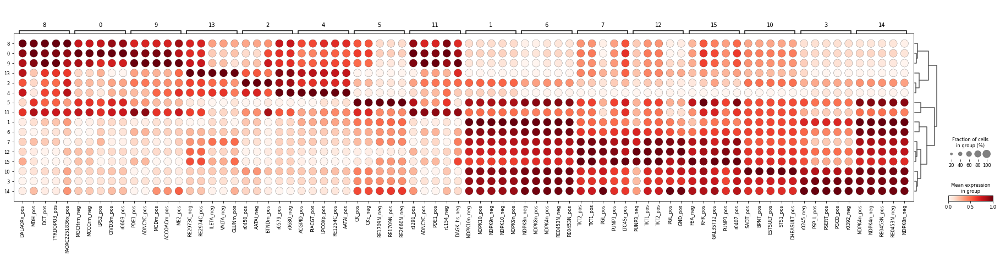

In [43]:
sc.pl.rank_genes_groups_dotplot(adata,
                               n_genes=5,
                               standard_scale='var')

In [44]:
subsystem_list=[]
for subsystem in adata.var['subsystem'].unique().tolist():
    sc.tl.score_genes(
        adata,
        adata.var.index[adata.var['subsystem']==subsystem].tolist(),
        score_name=subsystem
                 )
    subsystem_list.append(subsystem)

/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will ra

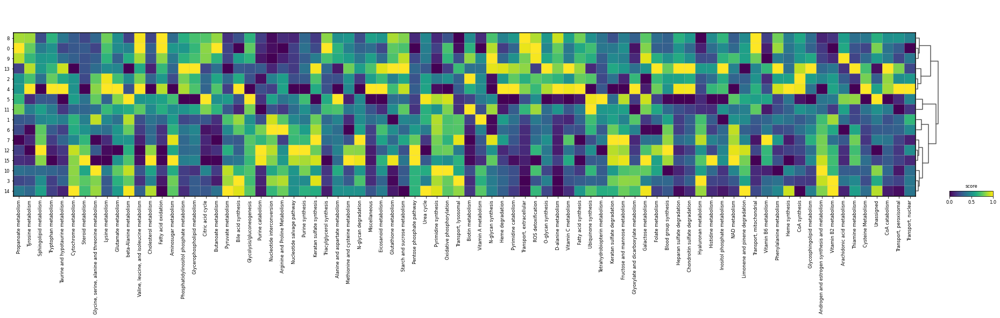

In [45]:
sc.pl.matrixplot(adata,
              var_names=subsystem_list,
              groupby='leiden',
             dendrogram=True,
                colorbar_title='score',
                standard_scale='var')

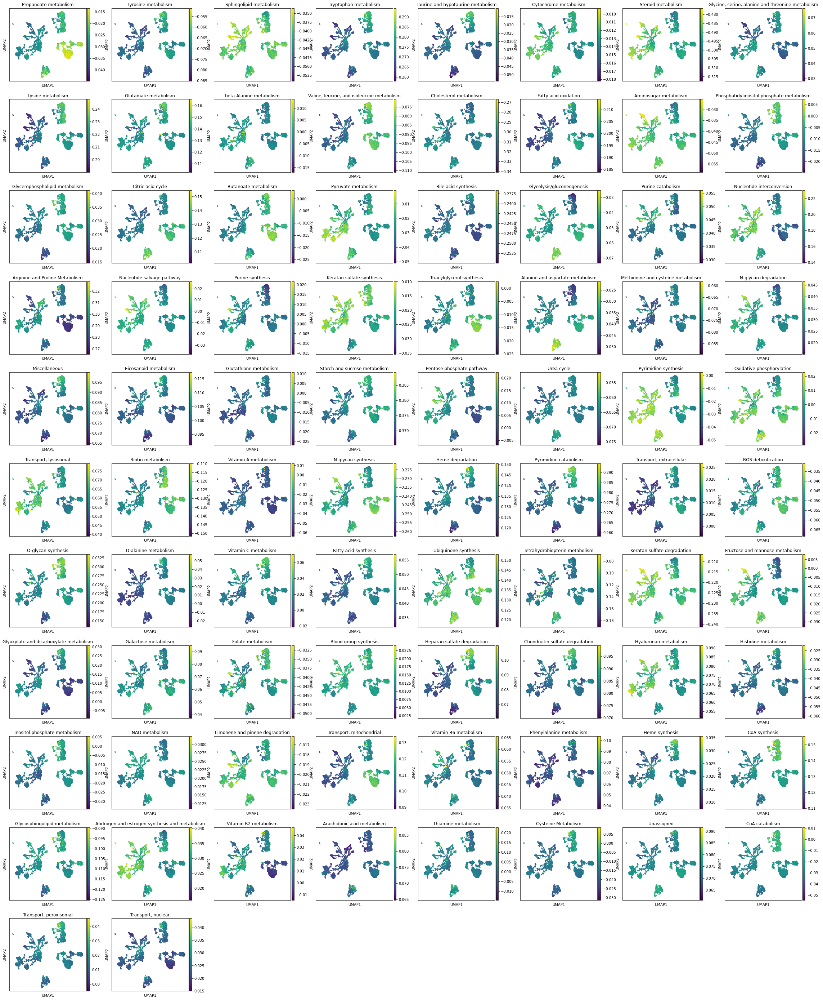

In [46]:
sk.set_figsize((4, 4))
sc.pl.umap(adata, color=subsystem_list,ncols=8)

Impression: cells vs nuclei has a profound impact.
Still getting a 2 group split even within cells and nuclei, and there are some processes which are specific to just one cluster...
Try cells only

# Nuclei only

In [47]:
adata = pooled_ad0.copy()
adata

AnnData object with n_obs × n_vars = 4614 × 1895
    obs: 'compass_sample_id', 'fine_grain', 'cluster', 'clus_fine_grain', 'clus_mid_grain', 'clus_coarse_grain', 'clus_donor', 'clus_cell_or_nuclei', 'clus_age', 'clus_age_binned', 'clus_kit_10x', 'clus_facility', 'clus_n_genes', 'clus_S_score', 'clus_G2M_score', 'clus_n_counts', 'clus_total_counts', 'clus_total_counts_mt', 'clus_total_counts_ribo'
    var: 'metadata_r_id', 'reaction_name', 'formula', 'associated_genes', 'subsystem', 'EC_number', 'confidence'

In [48]:
print(adata.shape)
adata=adata[adata.obs['clus_cell_or_nuclei']=='Nuclei']
print(adata.shape)

(4614, 1895)
(2270, 1895)


In [49]:
print(adata.X.data[:10])

In [50]:
#log normalising
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.raw = adata

/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.


In [51]:
print(adata.X.mean())
print(adata.X.std())

1.7103497
0.4980623


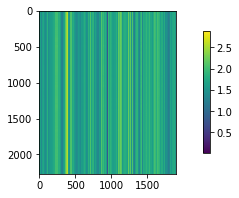

In [52]:
sk.set_figsize((10, 3))
plt.imshow(adata.X)
plt.colorbar(shrink=0.75);

In [53]:
adata.raw.X.sum(axis=1).min(), adata.raw.X.sum(axis=1).max()

(3220.6523, 3250.9104)

In [54]:
sc.pp.scale(adata, zero_center=True, max_value=10)

In [55]:
sc.pp.pca(adata, use_highly_variable=False)
sc.pp.neighbors(adata)
sc.tl.umap(adata)

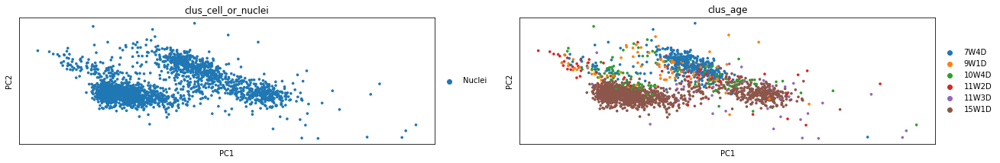

In [56]:
sc.pl.pca(adata,color=['clus_cell_or_nuclei','clus_age'])

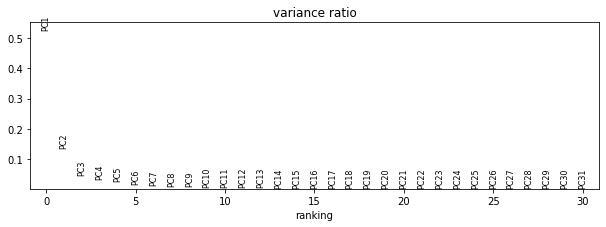

In [57]:
sc.pl.pca_variance_ratio(adata)

In [58]:
sc.tl.leiden(adata, resolution=0.2, key_added="leiden")

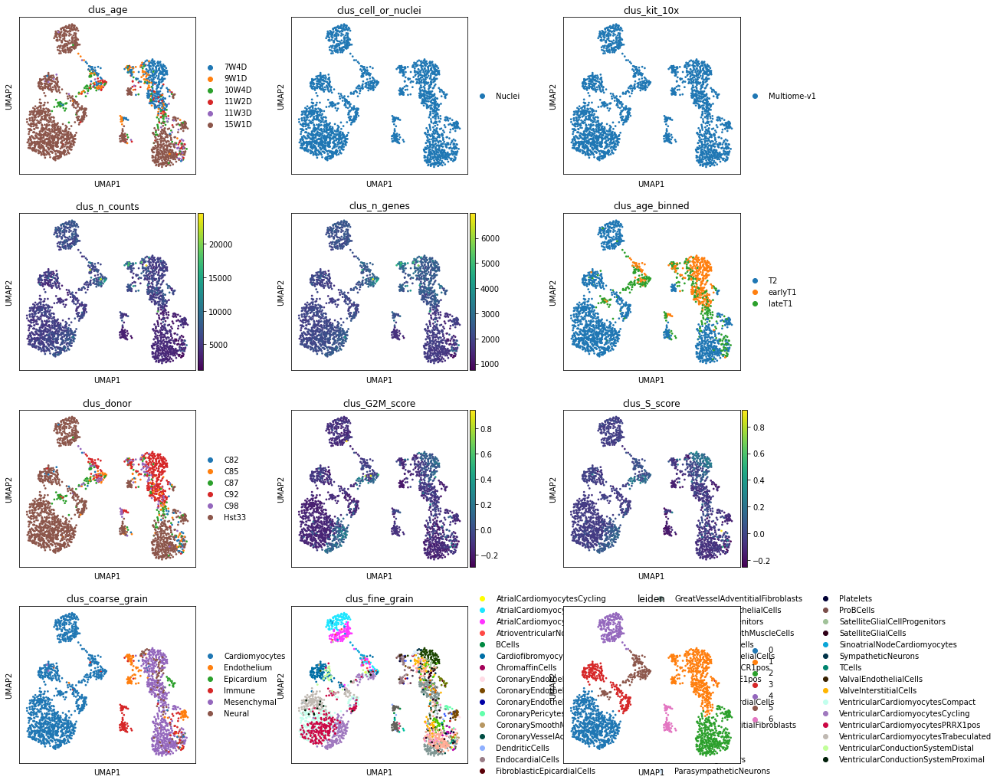

In [59]:
sk.set_figsize((4, 4))
sc.pl.umap(adata, wspace=0.4, size=30,ncols=3,
          color=['clus_age','clus_cell_or_nuclei','clus_kit_10x','clus_n_counts','clus_n_genes','clus_age_binned','clus_donor','clus_G2M_score','clus_S_score','clus_coarse_grain','clus_fine_grain','leiden'])

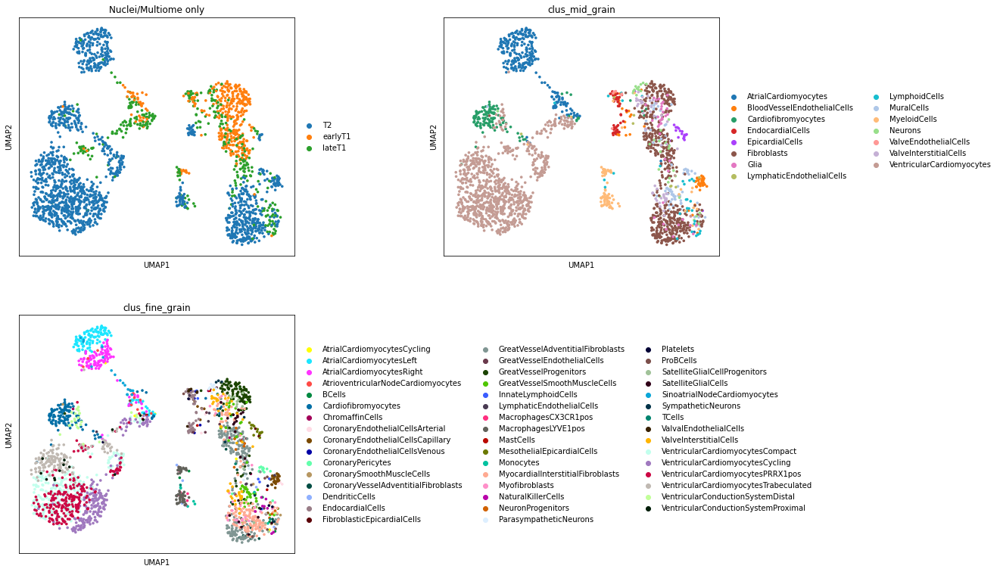

In [60]:
sk.set_figsize([6,6])
sc.pl.umap(adata, color=["clus_age_binned",
#                         'clus_cell_or_nuclei',
                         'clus_mid_grain',
                         'clus_fine_grain'],wspace=0.4,ncols=2,
          title='Nuclei/Multiome only')

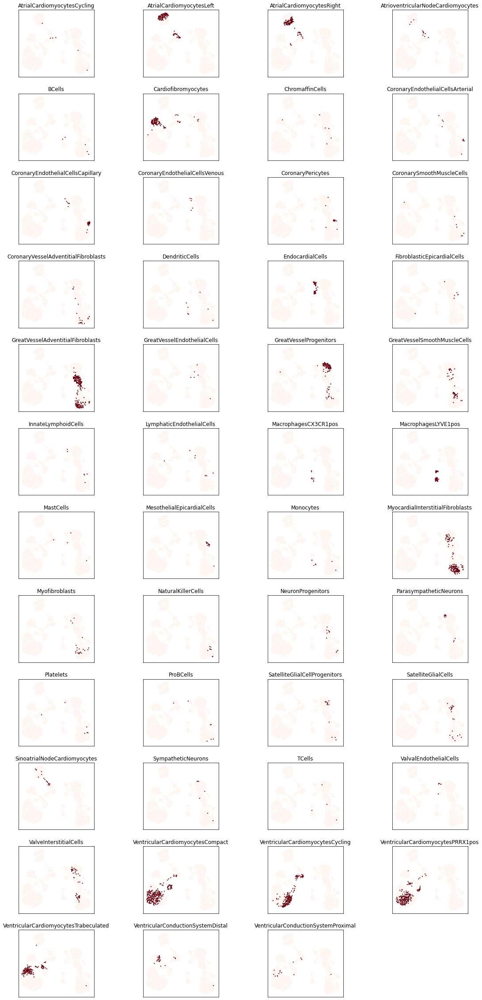

In [61]:
sk.highlight(
    adata, basis="umap", groupby="clus_fine_grain", wspace=0.5, figsize=(3, 3), size=20
)

In [63]:
subsystem_list=[]
for subsystem in adata.var['subsystem'].unique().tolist():
    sc.tl.score_genes(
        adata,
        adata.var.index[adata.var['subsystem']==subsystem].tolist(),
        score_name=subsystem
                 )
    subsystem_list.append(subsystem)

/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will ra

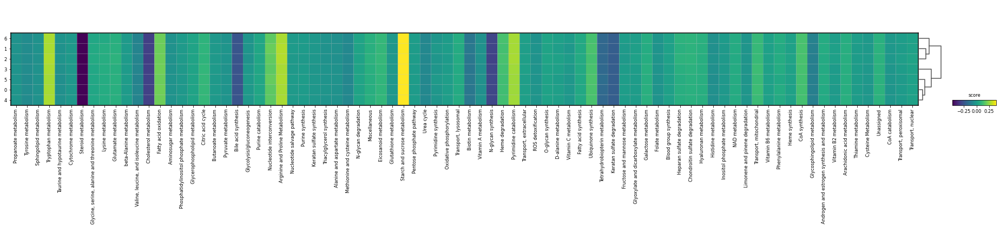

In [64]:
sc.pl.matrixplot(adata,
              var_names=subsystem_list,
              groupby='leiden',
             dendrogram=True,
                colorbar_title='score')

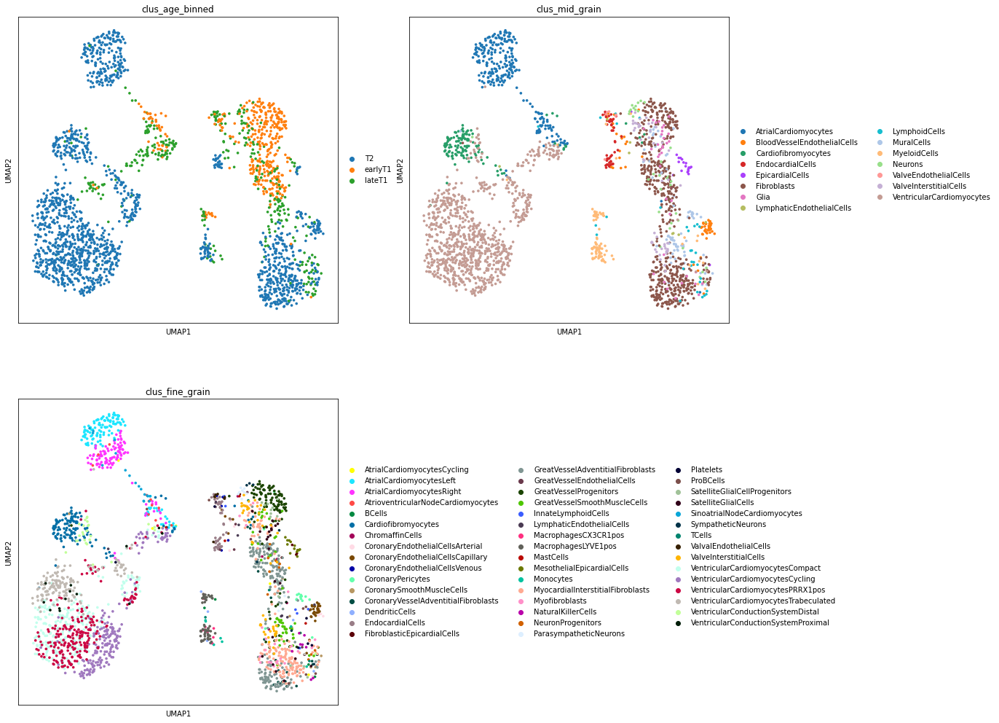

In [73]:
sk.set_figsize((8, 8))
sc.pl.umap(adata, color=["clus_age_binned",'clus_mid_grain','clus_fine_grain'],ncols=2)

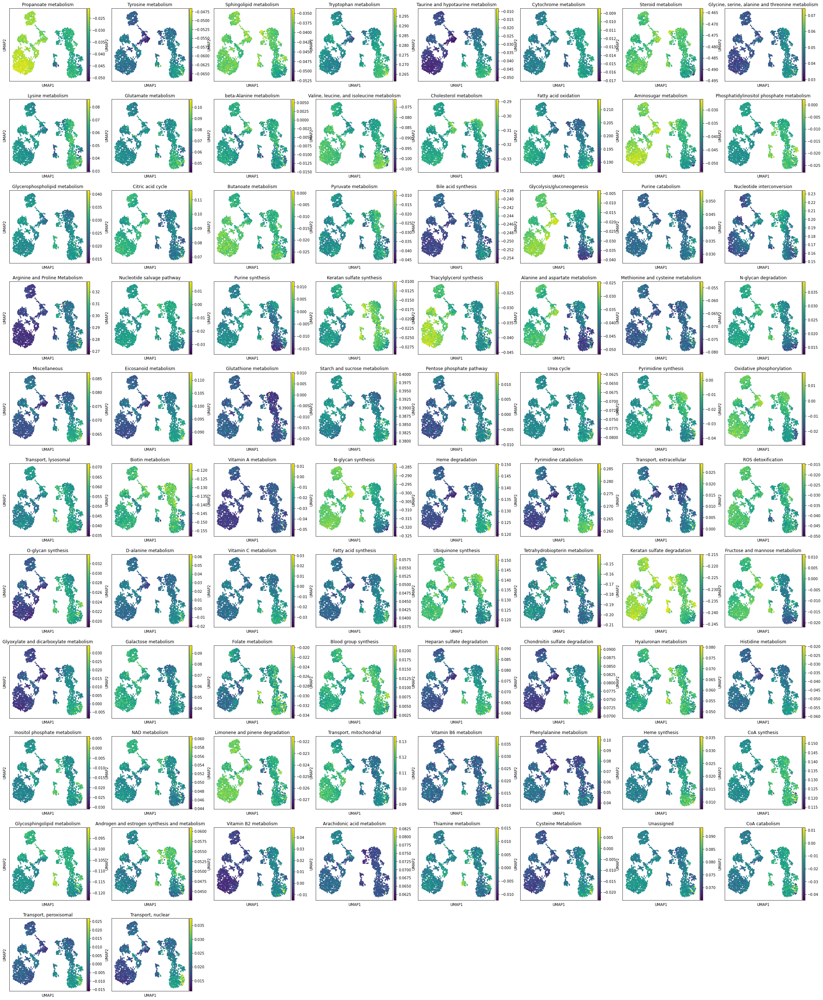

In [66]:
sk.set_figsize((4, 4))
sc.pl.umap(adata, color=subsystem_list,ncols=8)

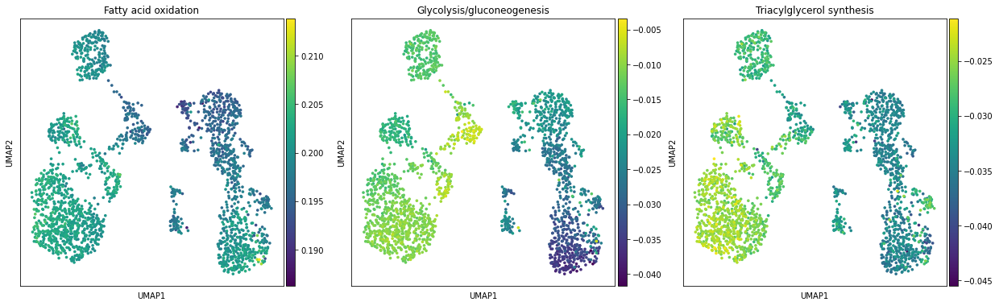

In [77]:
sk.set_figsize((6, 6))
sc.pl.umap(adata, color=['Fatty acid oxidation','Glycolysis/gluconeogenesis','Triacylglycerol synthesis'],ncols=3)